Nombre: Johan Esteban Ordenes Galleguillos

Rut: 19.505.464-9

# Comparando Clusters

Utilice los siguientes datasets bidimensionales para practicar los diferentes modelos de clustering. En cada uno de ellos grafique para ver los resultados y poder predictivo.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture

n_samples = 1500
circulos = datasets.make_circles(n_samples=n_samples, factor=.5,
                                      noise=.05)
lunas = datasets.make_moons(n_samples=n_samples, noise=.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sin_estructura = np.random.rand(n_samples, 2), None

# Datos anisotrópicos
random_state = 42
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
anisot = (X_aniso, y)

# blobs de varianza variable xD
variados = datasets.make_blobs(n_samples=n_samples,
                             cluster_std=[1.0, 2.5, 0.5],
                             random_state=random_state)



# Los datasets
Utilice las siguientes variables como datasets para su clustering:
* circulos
* lunas
* blobs
* sin_estructura
* anisot
* variedos

Revise las variables en el siguiente cuadro

# Recomendación:
Se recomienda escalar las variables para seleccionar mejor los parámetros de cada modelo.

    X = StandardScaler().fit_transform(X)

## Juegue
No olvide incorporar su análisis y conclusión respecto a los resultados

Primero que todo creamos una función general para poder graficar los datasets y visualizar todos los datos de una forma más sencilla e intuitiva

In [2]:
import pandas as pd

def chart(type):
    df = pd.DataFrame(type[0])
    df.plot.scatter(x=0,y=1)

# Dataset Círculos

Básicamente contiene 2 círculos concéntricos que da a entender que son 2 clusters por separado

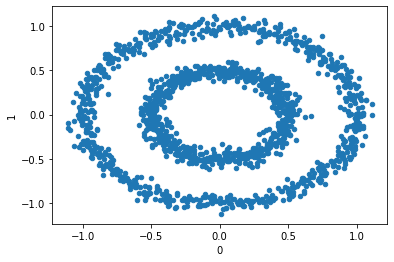

In [3]:
chart(circulos)

# Dataset Lunas
Básicamente son 2 líneas una frente a otra la cual da a entender que son 2 clústers

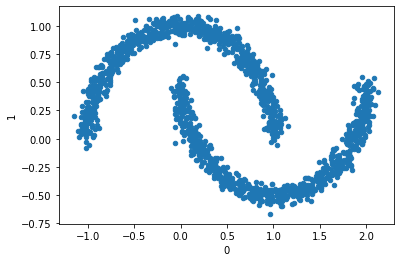

In [4]:
chart(lunas)

# Dataset Blobs
Básicamente son 3 bolitas separadas entre sí, lo cual nos da a entender que son 3 clústers 

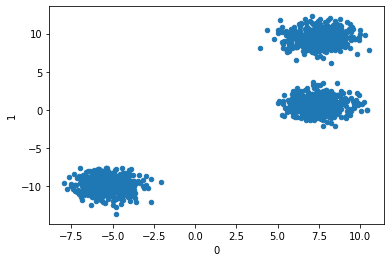

In [5]:
chart(blobs)

# Dataset Sin Estructura
Básicamente me da a entender que son datos desordenados y al azar, en los cuales no se puede ver ningún clúster a simple vista

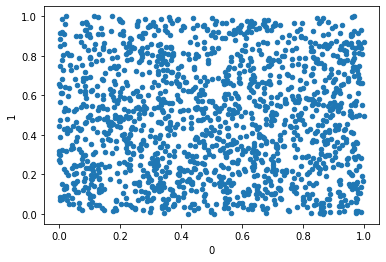

In [6]:
chart(sin_estructura)

# Dataset anisot
Básicamente son 3 lineas ovaladas separadas, las cuales dan a entender que son 3 clústers

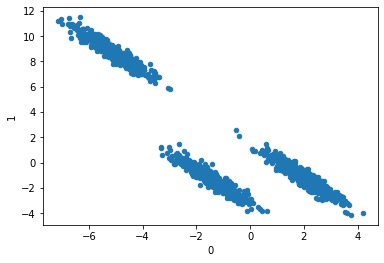

In [7]:
chart(anisot)

# Dataset Variados
Básicamente son 3 conjuntos de datos separados, el primero tiene los datos muy agrupados, el segundo tiene los datos semi agrupados, y el tercero tiene datos dispersos pero que se pueden ver a simple vista que estan agrupados, lo que me dá a entender que son 3 clústers.

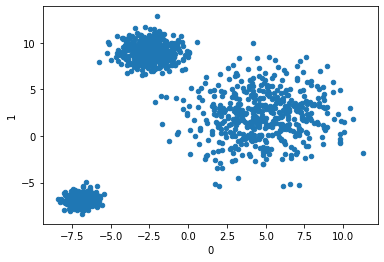

In [8]:
chart(variados)

Luego de ver los datos iniciales, definimos una función general para graficar todos los clústers que se mostrarán más adelante, la función de métricas de validación de la predicción, y la función de los clústers que necesitan predecirse con ajustes.

In [9]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift
from sklearn.cluster import estimate_bandwidth
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
import sklearn.utils
import sklearn.metrics as metrics

from sklearn.metrics.cluster import contingency_matrix

def clustering(form, clusters=2, type="km"):
    X = StandardScaler().fit_transform(form[0])
    Y = form[1]
    cluster = None

    if(type=="km"):
        cluster = KMeans(n_clusters=clusters).fit(X)
    elif(type=="mbkm"):
        cluster = MiniBatchKMeans(n_clusters=clusters, random_state=0, batch_size=500).fit(X)
    elif(type=="gm"):
        cluster = GaussianMixture(n_components=clusters).fit(X)
    elif(type=="ms"):
        bandwidth = estimate_bandwidth(X, quantile=0.2)
        print('Bandwidth:', bandwidth)
        cluster = MeanShift(bandwidth=bandwidth).fit(X)
    elif(type=="dbs"):
        cluster = DBSCAN(eps=0.123, min_samples = clusters)
        fit(X, Y, cluster)
        return;
    elif(type=="ac"):
        cluster = AgglomerativeClustering(n_clusters=clusters)
        fit(X, Y, cluster)
        return

    predictions = cluster.predict(X)
    validate(X, Y, predictions)
    plt.scatter(X[:, 0], X[:, 1], c=predictions, s=50, cmap='viridis')

    if(type!="gm"):
        centroids = cluster.cluster_centers_
        plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=150, alpha=0.5);

def fit(X, Y, cluster):
    clusters = cluster.fit_predict(X)
    validate(X, Y, clusters)
    plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis")

def validate(X, Y, predictions):
    print("VALIDACIÓN DEL MODELO\n-------------------------")
    try:
        print("Matriz de Contingencia:", contingency_matrix(Y,predictions))
        print("Adjusted Rand Index:", metrics.adjusted_rand_score(Y, predictions))
        print("Fowlkes-Mallows Index:", metrics.fowlkes_mallows_score(Y,predictions))
        print("V-Measure:", metrics.v_measure_score(Y, predictions))
        print("Silhouette Coefficient:", metrics.silhouette_score(X, predictions))
        print("Calinski-Harabasz Index:", metrics.calinski_harabasz_score(X,predictions))
    except:
        print("No se puede validar este modelo debido a que sus datos son demasiado dispersos")
    

# Clustering con KMEANS

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[376 374]
 [386 364]]
Adjusted Rand Index: -0.0004894893096139585
Fowlkes-Mallows Index: 0.49948560630307687
V-Measure: 0.000128288048384576
Silhouette Coefficient: 0.3528788491711152
Calinski-Harabasz Index: 858.6065898397502


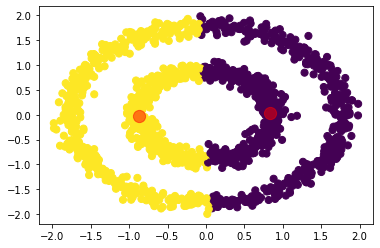

In [10]:
clustering(form=circulos)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[110 640]
 [635 115]]
Adjusted Rand Index: 0.4896595612028019
Fowlkes-Mallows Index: 0.744665227927392
V-Measure: 0.39019675698700673
Silhouette Coefficient: 0.498424521283701
Calinski-Harabasz Index: 2110.070386995222


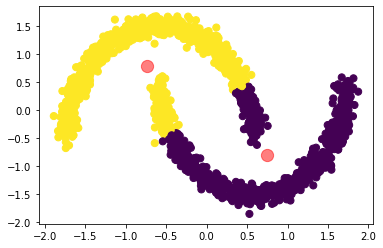

In [11]:
clustering(form=lunas)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[500   0   0]
 [  0   0 500]
 [  0 500   0]]
Adjusted Rand Index: 1.0
Fowlkes-Mallows Index: 1.0
V-Measure: 1.0
Silhouette Coefficient: 0.8104321767519068
Calinski-Harabasz Index: 34626.60397298819


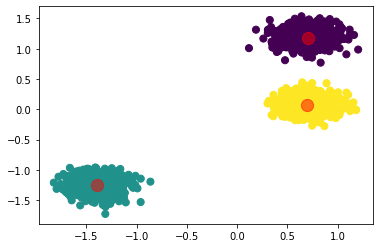

In [12]:
clustering(form=blobs, clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
No se puede validar este modelo debido a que sus datos son demasiado dispersos


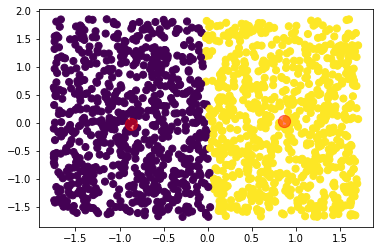

In [13]:
clustering(form=sin_estructura, clusters=2)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[500   0   0]
 [  0   5 495]
 [  0 497   3]]
Adjusted Rand Index: 0.9841068374748132
Fowlkes-Mallows Index: 0.9893975182638632
V-Measure: 0.9718773404520598
Silhouette Coefficient: 0.7400663317650614
Calinski-Harabasz Index: 14890.46357059817


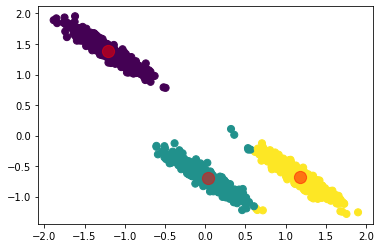

In [14]:
clustering(form=anisot, clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0 500   0]
 [  0  15 485]
 [500   0   0]]
Adjusted Rand Index: 0.9704149765821841
Fowlkes-Mallows Index: 0.9802664972324066
V-Measure: 0.9589753057921949
Silhouette Coefficient: 0.7799175132122473
Calinski-Harabasz Index: 9784.523136422473


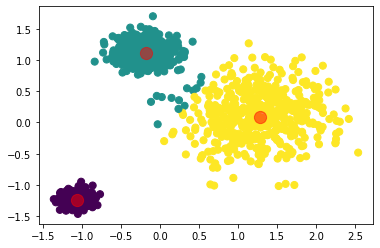

In [15]:
clustering(form=variados, clusters=3)

# Clustering con K-MEANS MiniBatch

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[375 375]
 [367 383]]
Adjusted Rand Index: -0.0005536270162502554
Fowlkes-Mallows Index: 0.4994179244887915
V-Measure: 8.208758321503527e-05
Silhouette Coefficient: 0.35276440665862513
Calinski-Harabasz Index: 857.2977079749571


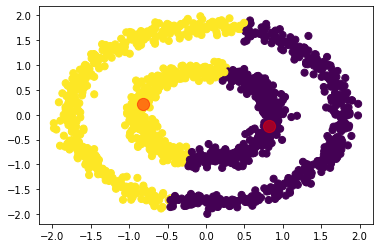

In [16]:
clustering(form=circulos, type="mbkm")

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[110 640]
 [634 116]]
Adjusted Rand Index: 0.48779343413669946
Fowlkes-Mallows Index: 0.7437340685380345
V-Measure: 0.3885468766923059
Silhouette Coefficient: 0.49837175336387524
Calinski-Harabasz Index: 2110.021673957034


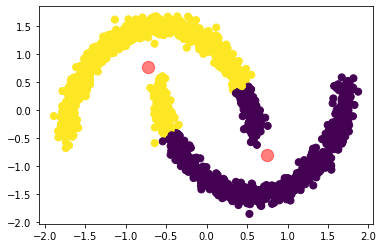

In [17]:
clustering(form=lunas, type="mbkm")

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0   0 500]
 [500   0   0]
 [  0 500   0]]
Adjusted Rand Index: 1.0
Fowlkes-Mallows Index: 1.0
V-Measure: 1.0
Silhouette Coefficient: 0.8104321767519068
Calinski-Harabasz Index: 34626.60397298819


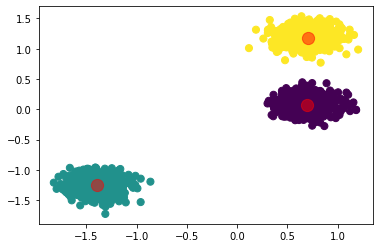

In [18]:
clustering(form=blobs, type='mbkm', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
No se puede validar este modelo debido a que sus datos son demasiado dispersos


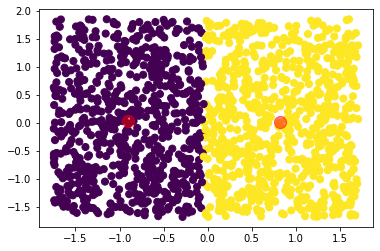

In [19]:
clustering(form=sin_estructura, type='mbkm', clusters=2)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0 500   0]
 [495   0   5]
 [  3   0 497]]
Adjusted Rand Index: 0.9841068374748132
Fowlkes-Mallows Index: 0.9893975182638632
V-Measure: 0.9718773404520595
Silhouette Coefficient: 0.7400663317650614
Calinski-Harabasz Index: 14890.46357059817


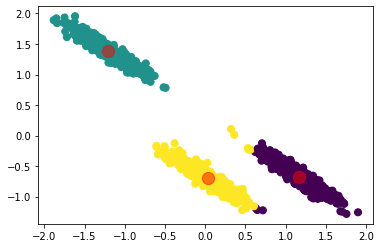

In [20]:
clustering(form=anisot, type='mbkm', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0   0 500]
 [  0 485  15]
 [500   0   0]]
Adjusted Rand Index: 0.9704149765821841
Fowlkes-Mallows Index: 0.9802664972324066
V-Measure: 0.9589753057921949
Silhouette Coefficient: 0.7799175132122473
Calinski-Harabasz Index: 9784.52313642247


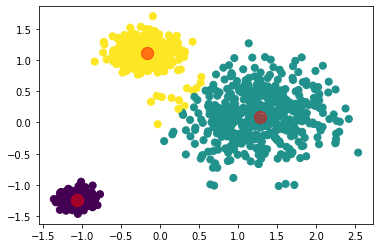

In [21]:
clustering(form=variados, type='mbkm', clusters=3)

# Clustering con Gaussian Mixture Models

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[367 383]
 [366 384]]
Adjusted Rand Index: -0.0006654345737302616
Fowlkes-Mallows Index: 0.4994621041496532
V-Measure: 1.2832930002001648e-06
Silhouette Coefficient: 0.35061805341684277
Calinski-Harabasz Index: 852.5750955623394


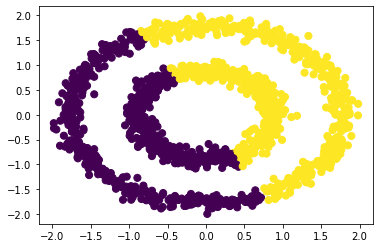

In [22]:
clustering(form=circulos, type='gm')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[104 646]
 [642 108]]
Adjusted Rand Index: 0.514243066336877
Fowlkes-Mallows Index: 0.7569629627759991
V-Measure: 0.412305913314434
Silhouette Coefficient: 0.4987487308931629
Calinski-Harabasz Index: 2106.903680311409


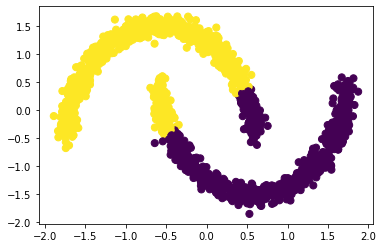

In [23]:
clustering(form=lunas, type='gm')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0   0 500]
 [  0 500   0]
 [500   0   0]]
Adjusted Rand Index: 1.0
Fowlkes-Mallows Index: 1.0
V-Measure: 1.0
Silhouette Coefficient: 0.8104321767519068
Calinski-Harabasz Index: 34626.60397298819


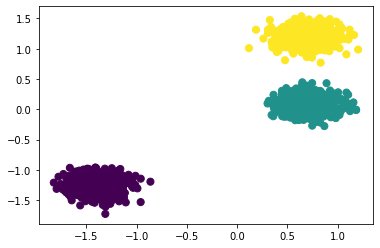

In [24]:
clustering(form=blobs, type='gm', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
No se puede validar este modelo debido a que sus datos son demasiado dispersos


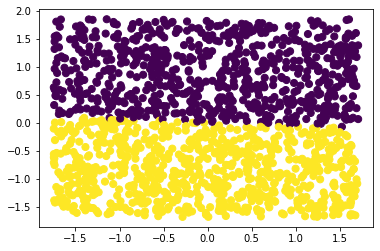

In [25]:
clustering(form=sin_estructura, type='gm')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[500   0   0]
 [  0 500   0]
 [  0   0 500]]
Adjusted Rand Index: 1.0
Fowlkes-Mallows Index: 1.0
V-Measure: 1.0
Silhouette Coefficient: 0.7394213958541977
Calinski-Harabasz Index: 14700.711323609708


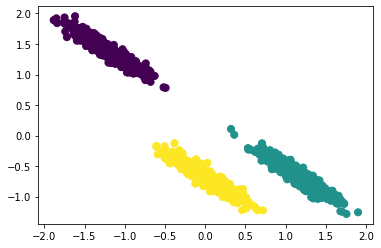

In [26]:
clustering(form=anisot, type='gm', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0   0 500]
 [  0 498   2]
 [500   0   0]]
Adjusted Rand Index: 0.9960026773689172
Fowlkes-Mallows Index: 0.9973333475982219
V-Measure: 0.9920851979682657
Silhouette Coefficient: 0.7772221284788763
Calinski-Harabasz Index: 9483.498095482804


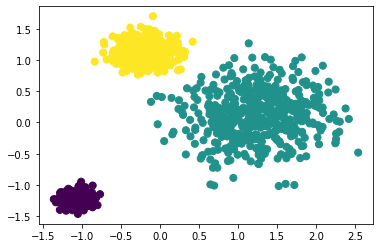

In [27]:
clustering(form=variados, type='gm', clusters=3)

# Clustering con Mean Shift

Bandwidth: 1.0432855344232055
VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[195 208 182 165]
 [201 206 181 162]]
Adjusted Rand Index: -0.000954560291086146
Fowlkes-Mallows Index: 0.3537936429902637
V-Measure: 4.2031301931473155e-05
Silhouette Coefficient: 0.37092432487363597
Calinski-Harabasz Index: 1304.0300367407983


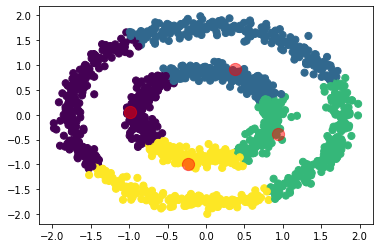

In [28]:
clustering(form=circulos, type='ms')

Bandwidth: 0.9562332245630325
VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  5 516 229]
 [522   6 222]]
Adjusted Rand Index: 0.46836203477385935
Fowlkes-Mallows Index: 0.6951686105108991
V-Measure: 0.49638539181339336
Silhouette Coefficient: 0.36700859339699643
Calinski-Harabasz Index: 1352.5380092213045


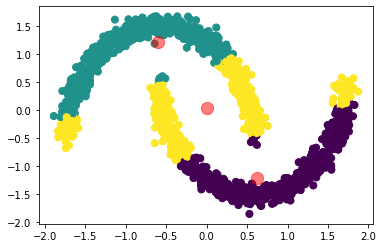

In [29]:
clustering(form=lunas, type='ms')

Bandwidth: 0.2785877756842824
VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0   0 500]
 [500   0   0]
 [  0 500   0]]
Adjusted Rand Index: 1.0
Fowlkes-Mallows Index: 1.0
V-Measure: 1.0
Silhouette Coefficient: 0.8104321767519068
Calinski-Harabasz Index: 34626.60397298819


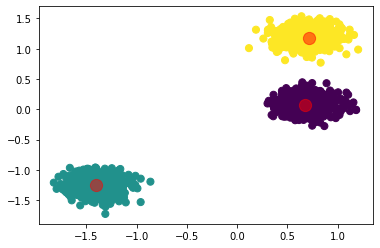

In [30]:
clustering(form=blobs, type='ms')

Bandwidth: 1.0415106365969589
VALIDACIÓN DEL MODELO
-------------------------
No se puede validar este modelo debido a que sus datos son demasiado dispersos


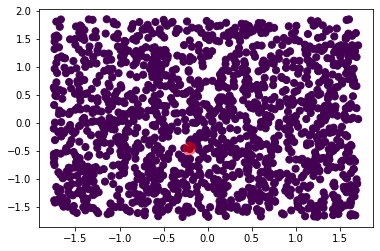

In [31]:
clustering(form=sin_estructura, type='ms')

Bandwidth: 0.3848701458286326
VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0   0 500]
 [495   5   0]
 [  2 498   0]]
Adjusted Rand Index: 0.9860795107114044
Fowlkes-Mallows Index: 0.9907135385861828
V-Measure: 0.9750904492064915
Silhouette Coefficient: 0.7402104778965771
Calinski-Harabasz Index: 14886.698298997258


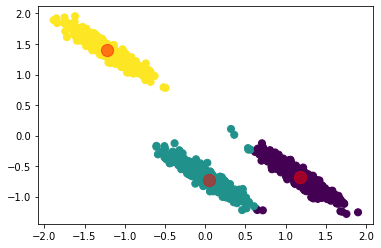

In [32]:
clustering(form=anisot, type='ms')

Bandwidth: 0.43160366763919794
VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0 500   0]
 [  0  13 487]
 [500   0   0]]
Adjusted Rand Index: 0.9743066218204904
Fowlkes-Mallows Index: 0.9828616100674815
V-Measure: 0.9633171778689563
Silhouette Coefficient: 0.7800650239997338
Calinski-Harabasz Index: 9778.25939397209


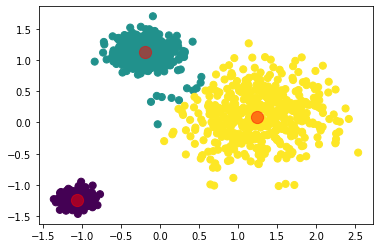

In [33]:
clustering(form=variados, type='ms')

# Clustering con DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  5   0 745   0]
 [  1 747   0   2]]
Adjusted Rand Index: 0.9893741695750461
Fowlkes-Mallows Index: 0.9946693703378782
V-Measure: 0.9745293332407438
Silhouette Coefficient: -0.13706928913958938
Calinski-Harabasz Index: 0.4430180818419824


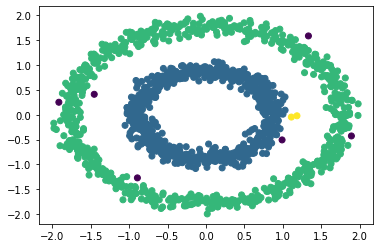

In [34]:
clustering(form=circulos, type='dbs')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  2 748   0]
 [  1   0 749]]
Adjusted Rand Index: 0.9960026560260584
Fowlkes-Mallows Index: 0.997997995996348
V-Measure: 0.9888613135167789
Silhouette Coefficient: 0.2892836749766377
Calinski-Harabasz Index: 657.8677204050922


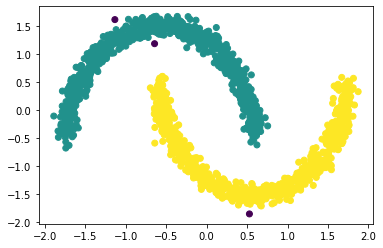

In [35]:
clustering(form=lunas, type='dbs')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  3 497   0   0]
 [  1   0 499   0]
 [  1   0   0 499]]
Adjusted Rand Index: 0.9949930125601126
Fowlkes-Mallows Index: 0.9966597522097616
V-Measure: 0.9887126321065657
Silhouette Coefficient: 0.8045195718585078
Calinski-Harabasz Index: 20997.96107766051


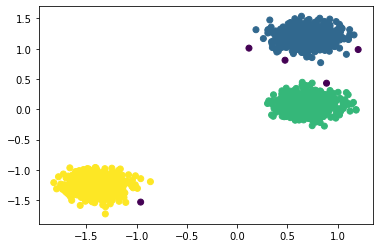

In [36]:
clustering(form=blobs, type='dbs', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
No se puede validar este modelo debido a que sus datos son demasiado dispersos


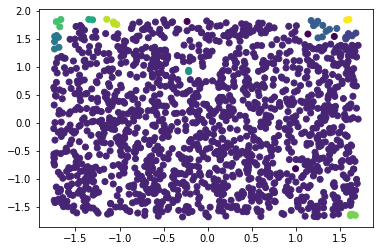

In [37]:
clustering(form=sin_estructura, type='dbs')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  2   0   0 498   0]
 [  3 494   0   0   3]
 [  1   0 499   0   0]]
Adjusted Rand Index: 0.9910031924054832
Fowlkes-Mallows Index: 0.9939980206230622
V-Measure: 0.981181121424535
Silhouette Coefficient: 0.6474781382084064
Calinski-Harabasz Index: 7361.262430980148


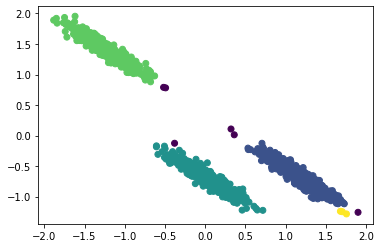

In [38]:
clustering(form=anisot, type='dbs', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  7   0   0 493   0   0   0   0   0   0]
 [ 26 444   0   2   5   4   6   7   3   3]
 [  0   0 500   0   0   0   0   0   0   0]]
Adjusted Rand Index: 0.9374552665340894
Fowlkes-Mallows Index: 0.958197683917166
V-Measure: 0.9056712636054023
Silhouette Coefficient: 0.4997707146700609
Calinski-Harabasz Index: 2272.541521338885


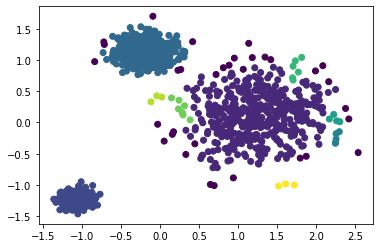

In [39]:
clustering(form=variados, type='dbs', clusters=3)

# Clustering con Hierarchical Clustering (Agglomerative Clustering)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[432 318]
 [487 263]]
Adjusted Rand Index: 0.004747545355712381
Fowlkes-Mallows Index: 0.5145284729288222
V-Measure: 0.0041684486564629395
Silhouette Coefficient: 0.3283489911468516
Calinski-Harabasz Index: 762.6443711570224


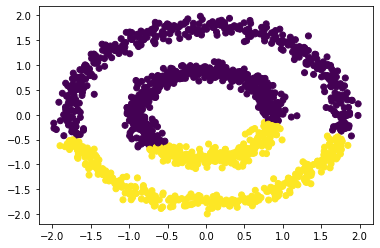

In [40]:
clustering(form=circulos, type='ac')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[750   0]
 [237 513]]
Adjusted Rand Index: 0.467536257476284
Fowlkes-Mallows Index: 0.747105851378731
V-Measure: 0.49486232181776835
Silhouette Coefficient: 0.44166468410737947
Calinski-Harabasz Index: 1548.2956523360647


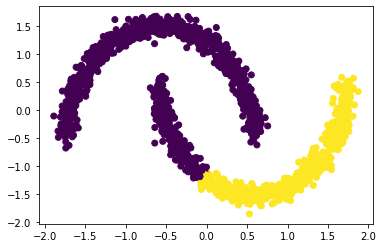

In [41]:
clustering(form=lunas, type='ac')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[500   0   0]
 [  0   0 500]
 [  0 500   0]]
Adjusted Rand Index: 1.0
Fowlkes-Mallows Index: 1.0
V-Measure: 1.0
Silhouette Coefficient: 0.8104321767519068
Calinski-Harabasz Index: 34626.60397298819


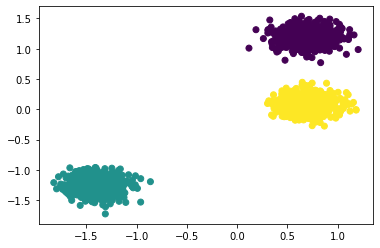

In [42]:
clustering(form=blobs, type='ac', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
No se puede validar este modelo debido a que sus datos son demasiado dispersos


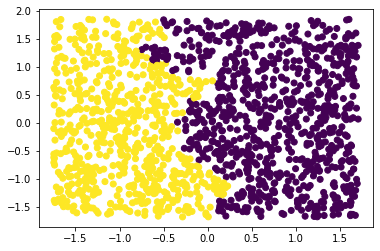

In [43]:
clustering(form=sin_estructura, type='ac')

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0 500   0]
 [  0   0 500]
 [500   0   0]]
Adjusted Rand Index: 1.0
Fowlkes-Mallows Index: 1.0
V-Measure: 1.0
Silhouette Coefficient: 0.7394213958541977
Calinski-Harabasz Index: 14700.711323609708


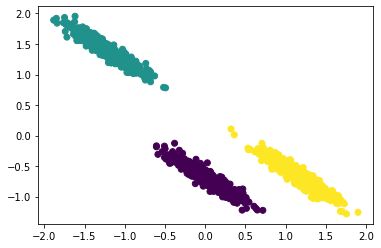

In [44]:
clustering(form=anisot, type='ac', clusters=3)

VALIDACIÓN DEL MODELO
-------------------------
Matriz de Contingencia: [[  0   0 500]
 [498   0   2]
 [  0 500   0]]
Adjusted Rand Index: 0.9960026773689172
Fowlkes-Mallows Index: 0.9973333475982219
V-Measure: 0.9920851979682657
Silhouette Coefficient: 0.7772221284788763
Calinski-Harabasz Index: 9483.498095482804


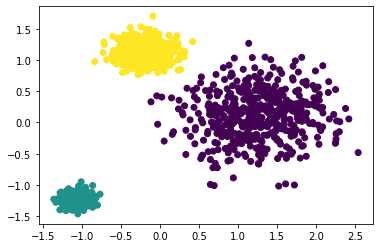

In [45]:
clustering(form=variados, type='ac', clusters=3)

Como conclusión, aplicar clustering nos ayuda mucho a la hora de hacer predicciones de datos, porque nos permite ver de forma visual la distribución de los datos agrupados y calcular algunos valores a través de los clusters como la media. Digamos que cada tipo de clustering tiene finalmente su forma matemática específica para agrupar los datos y es decisión de la persona que lo está ocupando decidir finalmente por utilizar uno u otro tipo de clustering, incluso para comparar cuál es el que más conviene utilizar en un proyecto determinado.

Uno de los clústers que tomó mayor cantidad de tiempo fue MeanShift que por deducción es por la forma en que se calculan los datos dentro del algoritmo en cuestión lo que no lo hace muy eficiente en tiempo que digamos, pero esto también va variando por la forma que toma el clúster, puede que el cálculo de predicción de datos tarden algunos más y otros menos. 

El otro problema que pude encontrar fue que al momento de hacer la validación de datos del programa cuando los datos estaban dispersos completamente, el programa no funcionaba, dado que no existía alguna validación porsible porque luego de hacer la predicción de los datos, estos finalmente quedaban igual de dispersos que antes de realizar la predicción, por ende no se pudo realizar la validación correspondiente.

En este caso creo que el clustering que otorgó la mejor agrupación de datos fue DBSCAN, el cual marca en color negro los datos que quizás están un poco más alejados del resto, que fácilmente se podrían filtrar si es que se requiere, para posteriormente poder realizar un análisis más cercano a la realidad, y finalmente otro punto positivo es que la ejecución del algoritmo se demora bastante poco.